In [64]:
import pandas as pd
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import  cross_val_score


In [65]:
df = pd.read_csv('../data/clean_game_data.csv', index_col=0)

In [66]:
cleandf = df.select_dtypes(include='number').drop(columns=['Year', 'Game ID'])
fig = px.imshow(cleandf.corr(), color_continuous_scale='RdBu', title='Correlation heatmap for all roles')
fig.update_layout(height=600, width=800)
fig.show()

As we can see here some features are correlated which would hinder the clustering process

In [67]:
cleandf_scaled = pd.DataFrame(StandardScaler().fit_transform(cleandf), columns=cleandf.columns)

In [68]:
# PCA

pca = PCA()
pca.fit(cleandf_scaled)

PCA()

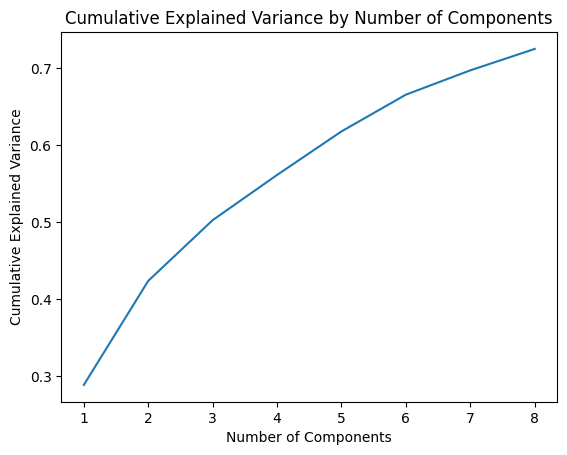

for at least 70.0% variance kept, we need 8 components
for at least 50.0% variance kept, we need 3 components


In [75]:
explained_variance = pca.explained_variance_ratio_
simple_exp_var = pd.DataFrame(explained_variance, columns=['Explained Variance'])
cumulative_exp_var= pd.DataFrame(np.cumsum(explained_variance), columns=['Cumulative Explained Variance'])
exp_var = pd.concat([simple_exp_var, cumulative_exp_var], axis=1)

summary_table = pd.concat([simple_exp_var, cumulative_exp_var], axis=1)

plt.plot(range(1, len(explained_variance)+1), np.cumsum(explained_variance))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Components')
plt.show()

threshold = 0.7
threshold2 = 0.5
print(f"for at least {threshold * 100}% variance kept, we need {np.argmax(np.cumsum(explained_variance) > threshold) + 1} components")
print(f"for at least {threshold2 * 100}% variance kept, we need {np.argmax(np.cumsum(explained_variance) > threshold2) + 1} components")

In [89]:
# Plotting the first two components

pca = PCA(n_components=8)
pca.fit(cleandf_scaled)
pca_df = pd.DataFrame(pca.transform(cleandf_scaled), columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8'])
df_reset = df.reset_index(drop=True)
pca_df['Role'] = df_reset['Role']

fig = px.scatter(pca_df, x='PC1', y='PC2', title='PCA plot of all roles, for PC1 and PC2', color=pca_df['Role'])
fig.update_layout(height=600, width=800)
fig.show()


In [92]:
fig = px.scatter(pca_df, x='PC1', y='PC3', title='PCA plot of all roles, for PC1 and PC3', color=pca_df['Role'])
fig.update_layout(height=600, width=800)
fig.show()

In [93]:
fig = px.scatter(pca_df, x='PC2', y='PC3', title='PCA plot of all roles, for PC2 and PC3', color=pca_df['Role'])
fig.update_layout(height=600, width=800)
fig.show()

In [103]:
# PC1 PC4

fig = px.scatter(pca_df, x='PC1', y='PC4', title='PCA plot of all roles, for PC1 and PC4', color=pca_df['Role'])
fig.update_layout(height=600, width=800)
fig.show()

In [101]:
# Correlation circle PC1 and PC2

import plotly.graph_objs as go

circle = go.Scatter(
    x=[0],
    y=[0],
    mode="markers",
    marker=dict(size=0),
    showlegend=False
)

arrows = []
annotations = []
for i, (pc1, pc2) in enumerate(zip(pca.components_[0], pca.components_[1])):
    arrows.append(go.Scatter(
        x=[0, pc1],
        y=[0, pc2],
        mode="lines+markers",
        line=dict(color="red", width=2),
        showlegend=False
    ))
    annotations.append(go.Scatter(
        x=[pc1],
        y=[pc2],
        text=cleandf.columns[i],
        mode="text",
        textposition="middle center",
        textfont=dict(color="blue"),
        showlegend=False
    ))

layout = go.Layout(
    title='Correlation circle for PC1 and PC2',
    xaxis=dict(title='PC1'),
    yaxis=dict(title='PC2'),
    width=700,
    height=700,
    shapes=[
        dict(
            type="circle",
            xref="x",
            yref="y",
            x0=-1,
            y0=-1,
            x1=1,
            y1=1,
            line=dict(color="black"),
        )
    ]
)

fig = go.Figure(data=[circle, *arrows, *annotations], layout=layout)
fig.show()


In [105]:
# Create a trace for each arrow and text annotation
arrows = []
annotations = []
for i, (pc1, pc3) in enumerate(zip(pca.components_[0], pca.components_[2])):
    arrows.append(go.Scatter(
        x=[0, pc1],
        y=[0, pc3],
        mode="lines+markers",
        line=dict(color="red", width=2),
        showlegend=False
    ))
    annotations.append(go.Scatter(
        x=[pc1],
        y=[pc3],
        text=cleandf.columns[i],
        mode="text",
        textposition="middle center",
        textfont=dict(color="blue"),
        showlegend=False
    ))

layout = go.Layout(
    title='Correlation circle for PC1 and PC3',
    xaxis=dict(title='PC1'),
    yaxis=dict(title='PC3'),
    width=700,
    height=700,
    shapes=[
        dict(
            type="circle",
            xref="x",
            yref="y",
            x0=-1,
            y0=-1,
            x1=1,
            y1=1,
            line=dict(color="black"),
        )
    ]
)

fig = go.Figure(data=[circle, *arrows, *annotations], layout=layout)
fig.show()

In [ ]:
arrows = []
annotations = []
for i, (pc1, pc3) in enumerate(zip(pca.components_[0], pca.components_[1])):
    arrows.append(go.Scatter(
        x=[0, pc1],
        y=[0, pc2],
        mode="lines+markers",
        line=dict(color="red", width=2),
        showlegend=False
    ))
    annotations.append(go.Scatter(
        x=[pc1],
        y=[pc2],
        text=cleandf.columns[i],
        mode="text",
        textposition="middle center",
        textfont=dict(color="blue"),
        showlegend=False
    ))

layout = go.Layout(
    title='Correlation circle for PC1 and PC3',
    xaxis=dict(title='PC1'),
    yaxis=dict(title='PC3'),
    width=700,
    height=700,
    shapes=[
        dict(
            type="circle",
            xref="x",
            yref="y",
            x0=-1,
            y0=-1,
            x1=1,
            y1=1,
            line=dict(color="black"),
        )
    ]
)

fig = go.Figure(data=[circle, *arrows, *annotations], layout=layout)
fig.show()